### Notebook for the generation of an integrated manifold with `scANVI`

- **Developed by:** Carlos Talavera-López Ph.D
- **Würzburg Institute for Systems Immunology & Julius-Maximilian-Universität Würzburg**
- v230811

### Import required modules

In [1]:
import torch
import scvi
import anndata
import warnings
import numpy as np
import scanpy as sc
import pandas as pd
from geosketch import gs
import matplotlib.pyplot as plt
from sklearn.utils import check_random_state
from scib_metrics.benchmark import Benchmarker

/Users/cartalop/mambaforge/envs/scvi-tools/lib/python3.9/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/Users/cartalop/mambaforge/envs/scvi-tools/lib/python3.9/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (
/Users/cartalop/mambaforge/envs/scvi-tools/lib/python3.9/site-packages/flax/struct.py:133: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(data_clz, keypaths)
/Users/cartalop/mambaforge/envs/scvi-tools/lib/python3.9/site-packages/flax/struct.py:133: FutureWarning: jax.tree_util.register_keypaths is depreca

### Set up working environment

In [2]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.8.0
scanpy      1.9.3
-----
PIL                 9.4.0
absl                NA
aiohttp             3.8.4
aiosignal           1.3.1
anyio               NA
appnope             0.1.3
asttokens           NA
async_timeout       4.0.2
attr                23.1.0
backcall            0.2.0
beta_ufunc          NA
binom_ufunc         NA
brotli              NA
bs4                 4.12.2
certifi             2022.12.07
cffi                1.15.1
charset_normalizer  2.1.1
chex                0.1.6
click               8.1.3
colorama            0.4.6
contextlib2         NA
croniter            NA
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.2
debugpy             1.6.6
decorator           5.1.1
deepdiff            6.3.0
docrep              0.3.2
executing           1.2.0
fastapi             0.99.1
fbpca               NA
flax                0.5.0
frozenlist          1.3.3
fsspec              2023.3.0
geosketch           1.2
h5py                3.8.0
hypergeom

In [3]:
warnings.simplefilter(action = 'ignore')
scvi.settings.seed = 1712
%config InlineBackend.print_figure_kwargs = {'facecolor' : "w"}
%config InlineBackend.figure_format = 'retina'
torch.set_float32_matmul_precision('medium')

Global seed set to 1712


In [4]:
arches_params = dict(
    use_layer_norm = "both",
    use_batch_norm = "none",
    encode_covariates = True,
    dropout_rate = 0.2,
    n_layers = 3,
)

### Read in Healthy data

In [5]:
adata_raw = sc.read_h5ad('../data/Marburg_cell_states_locked_ctl230811.raw.h5ad')
adata_raw

AnnData object with n_obs × n_vars = 97573 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', 'IAV_score', 'group', 'Viral_score', 'cell_type', 'cell_states', 'cell_compartment', 'seed_labels'
    var: 'mt', 'ribo'

### Select randomly 20K cells to use as test set for `scANVI`

In [6]:
adata_subset = sc.pp.subsample(adata_raw, n_obs = 20000, random_state = 1712, copy = True)
adata_subset.obs['cell_states'] = 'Unknown'
adata_subset

AnnData object with n_obs × n_vars = 20000 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', 'IAV_score', 'group', 'Viral_score', 'cell_type', 'cell_states', 'cell_compartment', 'seed_labels'
    var: 'mt', 'ribo'

In [7]:
adata_raw.obs['cell_states'] = adata_raw.obs['cell_states'].astype(str)
adata_subset.obs['cell_states'] = adata_subset.obs['cell_states'].astype(str)

subset_compartment_values = adata_subset.obs['cell_states']
adata_raw.obs.loc[adata_subset.obs.index, 'cell_states'] = subset_compartment_values
adata_raw.obs['cell_states'] = pd.Categorical(adata_raw.obs['cell_states'])

adata_raw.obs['cell_states'].value_counts()

Unknown                      20000
NOTCH+Basal2                  8262
MKI67+pBasal                  6652
FB-like_Basal                 5656
IGFBP+Basal                   5224
KRT14+Goblet                  4707
CCDC3+Basal1                  4567
MUC5B+Goblet                  4023
KRT17+Goblet                  3490
ifn_Basal                     3023
mixed_Goblet1                 2556
KRT14+AQP1+Secretory          2492
iav_Goblet                    2348
mixed_Goblet2                 2091
MHCII+Club                    1960
S100A2+Basal                  1910
ImmuneClub                    1854
SCGB1A1+Goblet                1747
DHRS9+Club                    1558
OMG+Ciliated                  1505
NOTCH3+SupraB                 1361
iavAPC_Epi                    1157
SERPINE1+Basal                1075
SERPINE2+Basal                 943
TNC+Basal                      862
ifn_Goblet                     812
RARRES1+lip_Goblet             740
IGFBP6+Basal                   699
iav-lip_Club        

In [8]:
adata_raw.obs['seed_labels'] = adata_raw.obs['cell_states'].copy()
adata_raw.obs['seed_labels'].value_counts()

Unknown                      20000
NOTCH+Basal2                  8262
MKI67+pBasal                  6652
FB-like_Basal                 5656
IGFBP+Basal                   5224
KRT14+Goblet                  4707
CCDC3+Basal1                  4567
MUC5B+Goblet                  4023
KRT17+Goblet                  3490
ifn_Basal                     3023
mixed_Goblet1                 2556
KRT14+AQP1+Secretory          2492
iav_Goblet                    2348
mixed_Goblet2                 2091
MHCII+Club                    1960
S100A2+Basal                  1910
ImmuneClub                    1854
SCGB1A1+Goblet                1747
DHRS9+Club                    1558
OMG+Ciliated                  1505
NOTCH3+SupraB                 1361
iavAPC_Epi                    1157
SERPINE1+Basal                1075
SERPINE2+Basal                 943
TNC+Basal                      862
ifn_Goblet                     812
RARRES1+lip_Goblet             740
IGFBP6+Basal                   699
iav-lip_Club        

### Select HVGs

In [9]:
raw_adata = adata_raw.copy()
adata_raw.layers['counts'] = adata_raw.X.copy()

sc.pp.highly_variable_genes(
    adata_raw,
    flavor = "seurat_v3",
    n_top_genes = 7000,
    layer = "counts",
    batch_key = "donor",
    subset = True
)
adata_raw

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


AnnData object with n_obs × n_vars = 97573 × 7000
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', 'IAV_score', 'group', 'Viral_score', 'cell_type', 'cell_states', 'cell_compartment', 'seed_labels'
    var: 'mt', 'ribo', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'hvg'
    layers: 'counts'

### Transfer of annotation with scANVI

In [10]:
scvi.model.SCVI.setup_anndata(adata_raw, 
categorical_covariate_keys = ["illumina_stimunr", "donor", "sample_group"], 
labels_key = "seed_labels", 
layer = 'counts')

In [11]:
scvi_model = scvi.model.SCVI(adata_raw, n_latent = 50, n_layers = 3, dispersion = 'gene-batch', gene_likelihood = 'nb')

In [12]:
scvi_model.train()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 82/82: 100%|██████████| 82/82 [1:57:38<00:00, 86.54s/it, v_num=1, train_loss_step=2.47e+3, train_loss_epoch=2.69e+3]

`Trainer.fit` stopped: `max_epochs=82` reached.


Epoch 82/82: 100%|██████████| 82/82 [1:57:38<00:00, 86.08s/it, v_num=1, train_loss_step=2.47e+3, train_loss_epoch=2.69e+3]


### Label transfer with `scANVI` 

In [13]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(scvi_model, 'Unknown')

In [14]:
scanvi_model.train()

INFO     Training for 10 epochs.                                                                                   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 10/10: 100%|██████████| 10/10 [24:31<00:00, 133.42s/it, v_num=1, train_loss_step=3.15e+3, train_loss_epoch=2.84e+3]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 10/10: 100%|██████████| 10/10 [24:31<00:00, 147.15s/it, v_num=1, train_loss_step=3.15e+3, train_loss_epoch=2.84e+3]


In [15]:
adata_raw.obs["C_scANVI"] = scanvi_model.predict(adata_raw)

- Extract latent representation

In [16]:
adata_raw.obsm["X_scANVI"] = scanvi_model.get_latent_representation(adata_raw)

- Visualise corrected dataset

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:44)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:32)


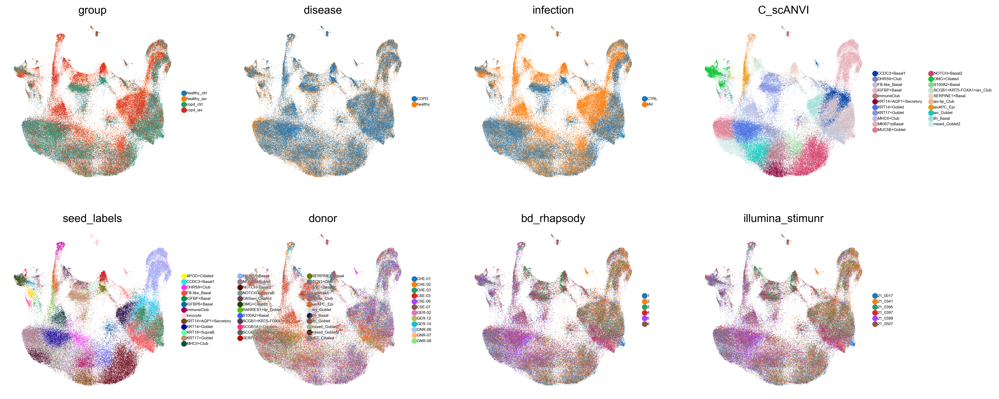

In [17]:
sc.pp.neighbors(adata_raw, use_rep = "X_scANVI", n_neighbors = 50, metric = 'minkowski')
sc.tl.umap(adata_raw, min_dist = 0.3, spread = 4, random_state = 1712)
sc.pl.umap(adata_raw, frameon = False, color = ['group', 'disease', 'infection', 'C_scANVI', 'seed_labels', 'donor', 'bd_rhapsody', 'illumina_stimunr'], size = 1, legend_fontsize = 5, ncols = 4)

In [18]:
sc.pl.umap(adata, frameon = False, color = ['SMK', 'n_genes', 'doublet_scores', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_counts', 'sample_group', 'IAV_score'], size = 1, legend_fontsize = 5, ncols = 4, cmap = 'plasma')

NameError: name 'adata' is not defined

### Compute integration metrics

In [ ]:
bm = Benchmarker(
    adata,
    batch_key = ["illumina_stimunr", "donor", "sample_group"],
    label_key = "C_scANVI",
    embedding_obsm_keys = ["X_pca", "X_scVI", "X_scANVI"],
    n_jobs = -1,
)
bm.benchmark()

In [ ]:
bm.plot_results_table(min_max_scale = False)

### Export annotated sample object 

In [ ]:
adata.obs.index = pd.Index(['-'.join(idx.split('-')[:3]) for idx in adata.obs.index])
adata.obs.index

In [ ]:
adata_raw.obs.index = pd.Index(['-'.join(idx.split('-')[:3]) for idx in adata_raw.obs.index])
adata_raw.obs.index

In [ ]:
adata.obs_names

In [ ]:
adata.obs['C_scANVI'].cat.categories

In [ ]:
adata.obs['C_scANVI'].value_counts()

### Export annotated object with raw counts

In [ ]:
adata

In [ ]:
adata_raw

In [ ]:
adata_export = anndata.AnnData(X = adata_raw.X, obs = adata.obs, var = adata_raw.var)
adata_export.obsm['X_scVI'] = adata.obsm['X_scVI'].copy()
adata_export.obsm['X_umap'] = adata.obsm['X_umap'].copy()
adata_export.obsm['X_scANVI'] = adata.obsm['X_scANVI'].copy()
adata_export